# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

In [93]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, Normalize

import tests

In [3]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [68]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [ToTensor(),
                  Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                 ]
    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [69]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.transform = transforms
#         self.directory = directory
        self.data = glob(directory + "/*" + extension)

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        
        return len(self.data)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        out_img = Image.open(self.data[index])
        out_img = self.transform(out_img)
        return out_img

In [ ]:
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

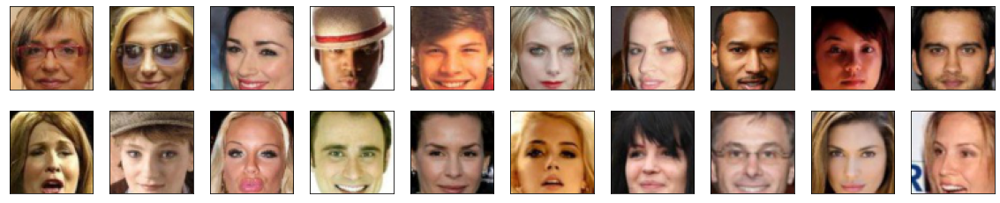

In [ ]:
def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [73]:
from torch.nn import Module
import torch.nn as nn

In [74]:
class ConvBlock(Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool = True):
        super(ConvBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=2, padding=1)
        self.act = nn.LeakyReLU(0.2)
        self.batchNorm = nn.BatchNorm2d(out_channels)
        self.is_batchNorm = batch_norm
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.is_batchNorm:
            x = self.batchNorm(x)
        x = self.act(x)
        return x

In [75]:
class Discriminator(Module):
    def __init__(self, conv_dim: int):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        self.conv1 = ConvBlock(3, conv_dim, 4, False)
        self.conv2 = ConvBlock(conv_dim, conv_dim*2, 4, False)
        self.conv3 = ConvBlock(conv_dim*2, conv_dim*4, 4, False)
        self.conv4 = ConvBlock(conv_dim*4, conv_dim*8, 4, False)
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(conv_dim*8*4*4, 1)
        self.sigmoid = nn.Sigmoid()
        
        self.model = nn.Sequential(self.conv1,
                                   self.conv2,
                                   self.conv3,
                                   self.conv4,
                                   self.flatten,
                                   self.fc,
#                                    self.sigmoid,
                                  )
        
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.model(x)
        return x[..., None, None]

In [ ]:
# run this cell to check your discriminator implementation
discriminator = Discriminator(conv_dim=64)
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [77]:
class DeconvBlock(Module):
    """
    A "de-convolutional" block is made of 3 layers: ConvTranspose -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - padding: padding of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, 
                 in_channels: int, 
                 out_channels: int, 
                 kernel_size: int, 
                 stride: int,
                 padding: int,
                 batch_norm: bool = True):
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.deconv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [78]:
class ApplyNoise(Module):
    """
    Noise injection layer with learnable parameters.
    
    args:
    - channels: number of channels of the input
    """
    def __init__(self, channels: int):
        super(ApplyNoise, self).__init__()
        ####
        # IMPLEMENT HERE
        ####
#         self.scale = torch.zeros(1, channels, 1, 1)
        self.channels = channels
        self.weights = nn.Parameter(torch.zeros(1, self.channels, 1, 1))
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        ####
        # IMPLEMENT HERE
        ####
        noise = torch.rand(1, 1, x.shape[-2], x.shape[-1])
        return x + noise * self.weights

In [79]:
class Generator(Module):
    def __init__(self, latent_dim: int ,conv_dim: int = 32):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        self.deconv1 = DeconvBlock(latent_dim, conv_dim*8, 4, 1, 0)
        self.noise1 = ApplyNoise(conv_dim*8)
        self.deconv2 = DeconvBlock(conv_dim*8, conv_dim*4, 4, 2, 1)
        self.noise2 = ApplyNoise(conv_dim*4)
        self.deconv3 = DeconvBlock(conv_dim*4, conv_dim*2, 4, 2, 1)
        self.noise3 = ApplyNoise(conv_dim*2)
        self.deconv4 = DeconvBlock(conv_dim*2, conv_dim, 4, 2, 1)
        self.noise4 = ApplyNoise(conv_dim)
        self.deconv5 = nn.ConvTranspose2d(conv_dim, 3, 4, stride=2, padding=1)
        self.last_activation = nn.Tanh()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.deconv1(x)
        x = self.noise1(x)
        x = self.deconv2(x)
        x = self.noise2(x)
        x = self.deconv3(x)
        x = self.noise3(x)
        x = self.deconv4(x)
        x = self.noise4(x)
        x = self.deconv5(x)
        x = self.last_activation(x)
        return x

In [ ]:
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [81]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    # params
    lr = 0.0002
    beta1=0.5
    beta2=0.999 # default value

    # Create optimizers for the discriminator and generator
    d_optimizer = optim.Adam(discriminator.parameters(), lr, [beta1, beta2])
    g_optimizer = optim.Adam(generator.parameters(), lr, [beta1, beta2])
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [82]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    batch_size = fake_logits.size(0)
    labels = torch.ones(batch_size)
    labels = labels.cuda()
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(fake_logits.squeeze(), labels)
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [ ]:
def discriminator_loss(real_logits, fake_logits, smooth):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    
    ### calculate real loss ###
    batch_size = real_logits.size(0)
    # label smoothing
    if smooth:
        # smooth, real labels = 0.9
        labels = torch.ones(batch_size)*0.9
    else:
        labels = torch.ones(batch_size) # real labels = 1

    labels = labels.cuda()
    # binary cross entropy with logits loss
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    real_loss = criterion(real_logits.squeeze(), labels)
    ###########################
    
    ### calculate fake loss ###
    batch_size = fake_logits.size(0)
    labels = torch.zeros(batch_size) # fake labels = 0
    
    labels = labels.cuda()
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    fake_loss = criterion(fake_logits.squeeze(), labels)
    ###########################
    return real_loss + fake_loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [84]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [85]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    g_optimizer.zero_grad()
    
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float().to(device)
    fake_imgs = generator(z)
    fake_logits = discriminator(fake_imgs)
    g_loss = generator_loss(fake_logits)
    g_loss.backward()
    g_optimizer.step()
    
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    d_optimizer.zero_grad()
    
    # Generate fake images and compute logits
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float().to(device)
    fake_imgs = generator(z.detach()) # detach from compute graph
    fake_logits = discriminator(fake_imgs)
    
    real_logits = discriminator(real_images)
    
    d_loss = discriminator_loss(real_logits, fake_logits, smooth=True)
    d_loss.backward()
    d_optimizer.step()
    # tempolary
    gp = 0
    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [86]:
from datetime import datetime

In [87]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 30

# number of images in each batch
batch_size = 64

In [88]:
### For moving model to cuda, I define generator again.
class ApplyNoise(Module):
    """
    Noise injection layer with learnable parameters.
    
    args:
    - channels: number of channels of the input
    """
    def __init__(self, channels: int):
        super(ApplyNoise, self).__init__()
        ####
        # IMPLEMENT HERE
        ####
#         self.scale = torch.zeros(1, channels, 1, 1)
        self.channels = channels
        self.weights = nn.Parameter(torch.zeros(1, self.channels, 1, 1))
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        ####
        # IMPLEMENT HERE
        ####
        noise = torch.rand(1, 1, x.shape[-2], x.shape[-1]).to(device)
        return x + noise * self.weights
    

class Generator(Module):
    def __init__(self, latent_dim: int ,conv_dim: int = 32):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        self.deconv1 = DeconvBlock(latent_dim, conv_dim*8, 4, 1, 0)
        self.noise1 = ApplyNoise(conv_dim*8).to(device)
        self.deconv2 = DeconvBlock(conv_dim*8, conv_dim*4, 4, 2, 1)
        self.noise2 = ApplyNoise(conv_dim*4).to(device)
        self.deconv3 = DeconvBlock(conv_dim*4, conv_dim*2, 4, 2, 1)
        self.noise3 = ApplyNoise(conv_dim*2).to(device)
        self.deconv4 = DeconvBlock(conv_dim*2, conv_dim, 4, 2, 1)
        self.noise4 = ApplyNoise(conv_dim).to(device)
        self.deconv5 = nn.ConvTranspose2d(conv_dim, 3, 4, stride=2, padding=1)
        self.last_activation = nn.Tanh()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.deconv1(x)
        x = self.noise1(x)
        x = self.deconv2(x)
        x = self.noise2(x)
        x = self.deconv3(x)
        x = self.noise3(x)
        x = self.deconv4(x)
        x = self.noise4(x)
        x = self.deconv5(x)
        x = self.last_activation(x)
        return x

In [ ]:
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator(conv_dim=64).to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [ ]:
def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2025-01-02 12:58:58 | Epoch [1/20] | Batch 0/509 | d_loss: 1.3825 | g_loss: 0.7937
2025-01-02 12:59:04 | Epoch [1/20] | Batch 50/509 | d_loss: 0.3802 | g_loss: 13.2100
2025-01-02 12:59:09 | Epoch [1/20] | Batch 100/509 | d_loss: 0.4289 | g_loss: 4.5191
2025-01-02 12:59:14 | Epoch [1/20] | Batch 150/509 | d_loss: 0.7819 | g_loss: 2.1289
2025-01-02 12:59:19 | Epoch [1/20] | Batch 200/509 | d_loss: 1.0289 | g_loss: 1.9592
2025-01-02 12:59:24 | Epoch [1/20] | Batch 250/509 | d_loss: 0.8214 | g_loss: 1.9778
2025-01-02 12:59:29 | Epoch [1/20] | Batch 300/509 | d_loss: 0.9191 | g_loss: 2.1334
2025-01-02 12:59:34 | Epoch [1/20] | Batch 350/509 | d_loss: 0.8730 | g_loss: 1.6038
2025-01-02 12:59:39 | Epoch [1/20] | Batch 400/509 | d_loss: 0.9207 | g_loss: 2.2498
2025-01-02 12:59:44 | Epoch [1/20] | Batch 450/509 | d_loss: 0.9672 | g_loss: 1.3684
2025-01-02 12:59:49 | Epoch [1/20] | Batch 500/509 | d_loss: 0.9636 | g_loss: 2.1489


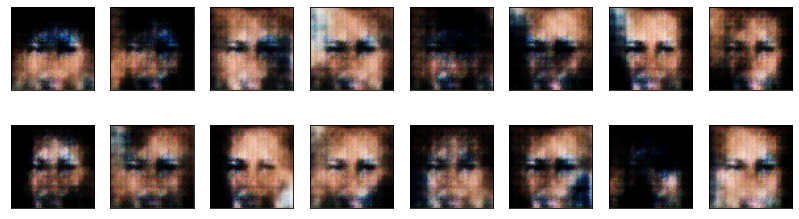

2025-01-02 12:59:54 | Epoch [2/20] | Batch 0/509 | d_loss: 0.9508 | g_loss: 2.2948
2025-01-02 12:59:59 | Epoch [2/20] | Batch 50/509 | d_loss: 0.9036 | g_loss: 1.4816
2025-01-02 13:00:04 | Epoch [2/20] | Batch 100/509 | d_loss: 0.7819 | g_loss: 1.6997
2025-01-02 13:00:09 | Epoch [2/20] | Batch 150/509 | d_loss: 1.0533 | g_loss: 3.2241
2025-01-02 13:00:14 | Epoch [2/20] | Batch 200/509 | d_loss: 0.8173 | g_loss: 2.3539
2025-01-02 13:00:19 | Epoch [2/20] | Batch 250/509 | d_loss: 0.9072 | g_loss: 2.1654
2025-01-02 13:00:24 | Epoch [2/20] | Batch 300/509 | d_loss: 0.8716 | g_loss: 2.2307
2025-01-02 13:00:29 | Epoch [2/20] | Batch 350/509 | d_loss: 0.6996 | g_loss: 2.4958
2025-01-02 13:00:34 | Epoch [2/20] | Batch 400/509 | d_loss: 0.8084 | g_loss: 2.5560
2025-01-02 13:00:39 | Epoch [2/20] | Batch 450/509 | d_loss: 0.8338 | g_loss: 2.3873
2025-01-02 13:00:44 | Epoch [2/20] | Batch 500/509 | d_loss: 0.9737 | g_loss: 1.7617


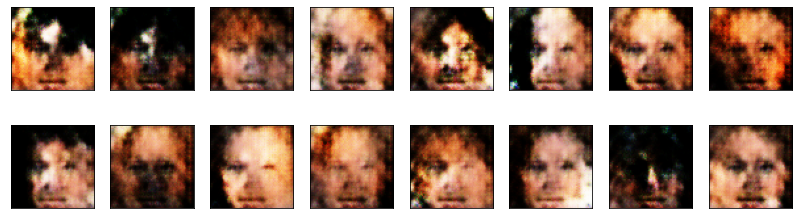

2025-01-02 13:00:48 | Epoch [3/20] | Batch 0/509 | d_loss: 1.0203 | g_loss: 3.2702
2025-01-02 13:00:54 | Epoch [3/20] | Batch 50/509 | d_loss: 0.7986 | g_loss: 2.0651
2025-01-02 13:00:59 | Epoch [3/20] | Batch 100/509 | d_loss: 0.8520 | g_loss: 1.8555
2025-01-02 13:01:04 | Epoch [3/20] | Batch 150/509 | d_loss: 1.2244 | g_loss: 2.9395
2025-01-02 13:01:09 | Epoch [3/20] | Batch 200/509 | d_loss: 0.8816 | g_loss: 2.6395
2025-01-02 13:01:14 | Epoch [3/20] | Batch 250/509 | d_loss: 1.1128 | g_loss: 2.6120
2025-01-02 13:01:19 | Epoch [3/20] | Batch 300/509 | d_loss: 0.9064 | g_loss: 2.5981
2025-01-02 13:01:24 | Epoch [3/20] | Batch 350/509 | d_loss: 0.9590 | g_loss: 1.7034
2025-01-02 13:01:29 | Epoch [3/20] | Batch 400/509 | d_loss: 0.7960 | g_loss: 2.7548
2025-01-02 13:01:34 | Epoch [3/20] | Batch 450/509 | d_loss: 0.7798 | g_loss: 2.6044
2025-01-02 13:01:39 | Epoch [3/20] | Batch 500/509 | d_loss: 0.8740 | g_loss: 2.3631


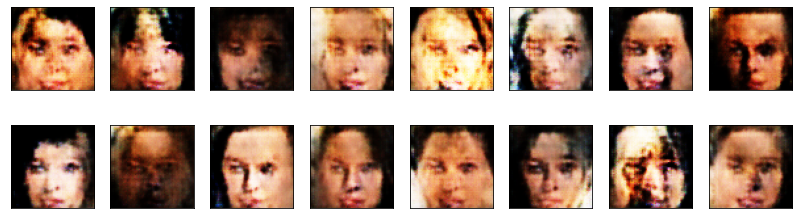

2025-01-02 13:01:43 | Epoch [4/20] | Batch 0/509 | d_loss: 0.8728 | g_loss: 2.7055
2025-01-02 13:01:49 | Epoch [4/20] | Batch 50/509 | d_loss: 0.9245 | g_loss: 2.7830
2025-01-02 13:01:54 | Epoch [4/20] | Batch 100/509 | d_loss: 0.6591 | g_loss: 2.8059
2025-01-02 13:01:59 | Epoch [4/20] | Batch 150/509 | d_loss: 0.8599 | g_loss: 1.9995
2025-01-02 13:02:04 | Epoch [4/20] | Batch 200/509 | d_loss: 0.8279 | g_loss: 2.5093
2025-01-02 13:02:09 | Epoch [4/20] | Batch 250/509 | d_loss: 0.8438 | g_loss: 2.1729
2025-01-02 13:02:14 | Epoch [4/20] | Batch 300/509 | d_loss: 0.7651 | g_loss: 2.3721
2025-01-02 13:02:19 | Epoch [4/20] | Batch 350/509 | d_loss: 0.8743 | g_loss: 3.1803
2025-01-02 13:02:24 | Epoch [4/20] | Batch 400/509 | d_loss: 0.7800 | g_loss: 2.3938
2025-01-02 13:02:29 | Epoch [4/20] | Batch 450/509 | d_loss: 0.9472 | g_loss: 1.8696
2025-01-02 13:02:34 | Epoch [4/20] | Batch 500/509 | d_loss: 0.7312 | g_loss: 2.2653


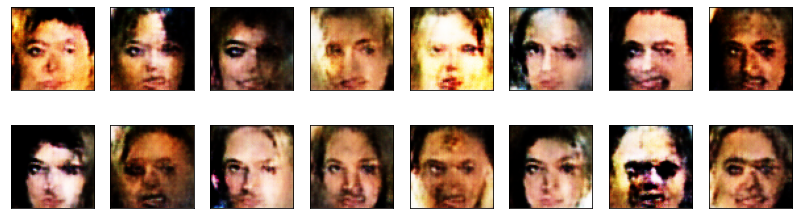

2025-01-02 13:02:38 | Epoch [5/20] | Batch 0/509 | d_loss: 0.8154 | g_loss: 2.3448
2025-01-02 13:02:43 | Epoch [5/20] | Batch 50/509 | d_loss: 1.0903 | g_loss: 1.6102
2025-01-02 13:02:48 | Epoch [5/20] | Batch 100/509 | d_loss: 1.0900 | g_loss: 2.6426
2025-01-02 13:02:54 | Epoch [5/20] | Batch 150/509 | d_loss: 0.8860 | g_loss: 2.4308
2025-01-02 13:02:59 | Epoch [5/20] | Batch 200/509 | d_loss: 0.7800 | g_loss: 2.6006
2025-01-02 13:03:04 | Epoch [5/20] | Batch 250/509 | d_loss: 0.8501 | g_loss: 2.6113
2025-01-02 13:03:09 | Epoch [5/20] | Batch 300/509 | d_loss: 0.9052 | g_loss: 2.7284
2025-01-02 13:03:14 | Epoch [5/20] | Batch 350/509 | d_loss: 0.8196 | g_loss: 2.2539
2025-01-02 13:03:19 | Epoch [5/20] | Batch 400/509 | d_loss: 0.8681 | g_loss: 2.7505
2025-01-02 13:03:24 | Epoch [5/20] | Batch 450/509 | d_loss: 0.9967 | g_loss: 2.7804
2025-01-02 13:03:29 | Epoch [5/20] | Batch 500/509 | d_loss: 1.0595 | g_loss: 2.6973


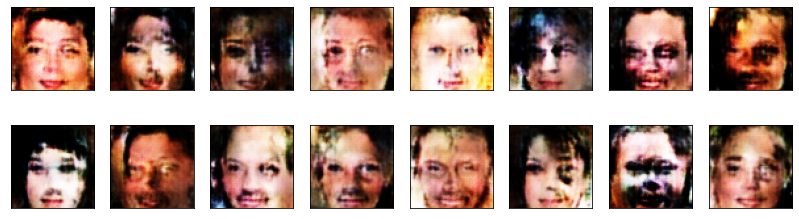

2025-01-02 13:03:34 | Epoch [6/20] | Batch 0/509 | d_loss: 0.9283 | g_loss: 1.8181
2025-01-02 13:03:39 | Epoch [6/20] | Batch 50/509 | d_loss: 0.9038 | g_loss: 1.8356
2025-01-02 13:03:44 | Epoch [6/20] | Batch 100/509 | d_loss: 0.8380 | g_loss: 1.9762
2025-01-02 13:03:49 | Epoch [6/20] | Batch 150/509 | d_loss: 1.0223 | g_loss: 1.4643
2025-01-02 13:03:54 | Epoch [6/20] | Batch 200/509 | d_loss: 0.9347 | g_loss: 1.7787
2025-01-02 13:03:59 | Epoch [6/20] | Batch 250/509 | d_loss: 0.8950 | g_loss: 1.7662
2025-01-02 13:04:04 | Epoch [6/20] | Batch 300/509 | d_loss: 0.8475 | g_loss: 2.3888
2025-01-02 13:04:09 | Epoch [6/20] | Batch 350/509 | d_loss: 0.8804 | g_loss: 1.9092
2025-01-02 13:04:14 | Epoch [6/20] | Batch 400/509 | d_loss: 0.7839 | g_loss: 2.4924
2025-01-02 13:04:19 | Epoch [6/20] | Batch 450/509 | d_loss: 0.8345 | g_loss: 1.9010
2025-01-02 13:04:24 | Epoch [6/20] | Batch 500/509 | d_loss: 0.8447 | g_loss: 2.3066


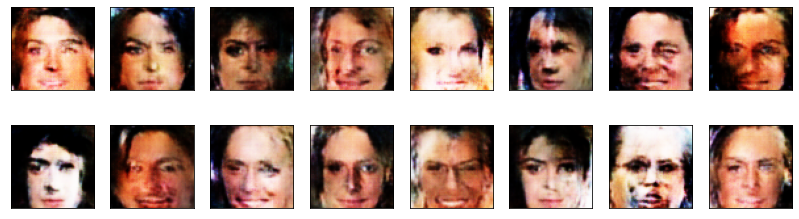

2025-01-02 13:04:29 | Epoch [7/20] | Batch 0/509 | d_loss: 0.9216 | g_loss: 1.5637
2025-01-02 13:04:34 | Epoch [7/20] | Batch 50/509 | d_loss: 1.0176 | g_loss: 1.2664
2025-01-02 13:04:39 | Epoch [7/20] | Batch 100/509 | d_loss: 0.9114 | g_loss: 2.6976
2025-01-02 13:04:44 | Epoch [7/20] | Batch 150/509 | d_loss: 0.9099 | g_loss: 2.2321
2025-01-02 13:04:49 | Epoch [7/20] | Batch 200/509 | d_loss: 0.9731 | g_loss: 1.7419
2025-01-02 13:04:55 | Epoch [7/20] | Batch 250/509 | d_loss: 0.8427 | g_loss: 1.7967
2025-01-02 13:05:00 | Epoch [7/20] | Batch 300/509 | d_loss: 0.9272 | g_loss: 2.7628
2025-01-02 13:05:05 | Epoch [7/20] | Batch 350/509 | d_loss: 0.7976 | g_loss: 2.5112
2025-01-02 13:05:10 | Epoch [7/20] | Batch 400/509 | d_loss: 0.8200 | g_loss: 1.9710
2025-01-02 13:05:15 | Epoch [7/20] | Batch 450/509 | d_loss: 0.9134 | g_loss: 2.1467
2025-01-02 13:05:20 | Epoch [7/20] | Batch 500/509 | d_loss: 0.8679 | g_loss: 2.3286


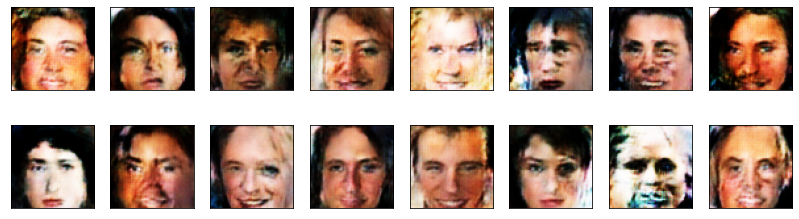

2025-01-02 13:05:24 | Epoch [8/20] | Batch 0/509 | d_loss: 0.9121 | g_loss: 1.8742
2025-01-02 13:05:29 | Epoch [8/20] | Batch 50/509 | d_loss: 0.8488 | g_loss: 2.5641
2025-01-02 13:05:34 | Epoch [8/20] | Batch 100/509 | d_loss: 0.8597 | g_loss: 2.2395
2025-01-02 13:05:39 | Epoch [8/20] | Batch 150/509 | d_loss: 0.9363 | g_loss: 2.2362
2025-01-02 13:05:44 | Epoch [8/20] | Batch 200/509 | d_loss: 1.0575 | g_loss: 2.0745
2025-01-02 13:05:49 | Epoch [8/20] | Batch 250/509 | d_loss: 0.8807 | g_loss: 2.8114
2025-01-02 13:05:54 | Epoch [8/20] | Batch 300/509 | d_loss: 0.7978 | g_loss: 1.9994
2025-01-02 13:05:59 | Epoch [8/20] | Batch 350/509 | d_loss: 0.7648 | g_loss: 2.4928
2025-01-02 13:06:04 | Epoch [8/20] | Batch 400/509 | d_loss: 1.0212 | g_loss: 1.6165
2025-01-02 13:06:09 | Epoch [8/20] | Batch 450/509 | d_loss: 0.8911 | g_loss: 2.0724
2025-01-02 13:06:14 | Epoch [8/20] | Batch 500/509 | d_loss: 0.9093 | g_loss: 2.3958


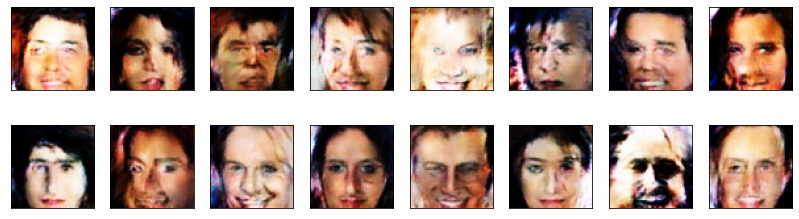

2025-01-02 13:06:20 | Epoch [9/20] | Batch 0/509 | d_loss: 0.8279 | g_loss: 2.1218
2025-01-02 13:06:25 | Epoch [9/20] | Batch 50/509 | d_loss: 0.9732 | g_loss: 2.7468
2025-01-02 13:06:30 | Epoch [9/20] | Batch 100/509 | d_loss: 0.8730 | g_loss: 2.1291
2025-01-02 13:06:35 | Epoch [9/20] | Batch 150/509 | d_loss: 0.9219 | g_loss: 2.1174
2025-01-02 13:06:40 | Epoch [9/20] | Batch 200/509 | d_loss: 0.9467 | g_loss: 2.0938
2025-01-02 13:06:45 | Epoch [9/20] | Batch 250/509 | d_loss: 0.8750 | g_loss: 2.3426
2025-01-02 13:06:50 | Epoch [9/20] | Batch 300/509 | d_loss: 0.8215 | g_loss: 1.9756
2025-01-02 13:06:56 | Epoch [9/20] | Batch 350/509 | d_loss: 0.8801 | g_loss: 2.3311
2025-01-02 13:07:01 | Epoch [9/20] | Batch 400/509 | d_loss: 1.0107 | g_loss: 1.2493
2025-01-02 13:07:06 | Epoch [9/20] | Batch 450/509 | d_loss: 0.8906 | g_loss: 2.2187
2025-01-02 13:07:11 | Epoch [9/20] | Batch 500/509 | d_loss: 0.8673 | g_loss: 1.8921


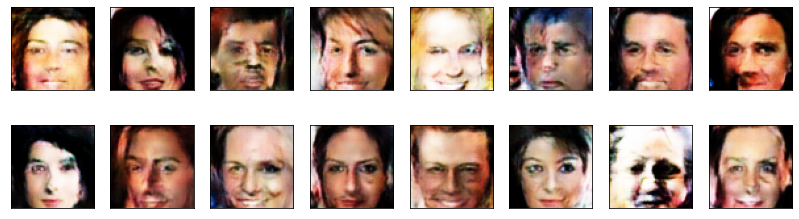

2025-01-02 13:07:15 | Epoch [10/20] | Batch 0/509 | d_loss: 0.8546 | g_loss: 1.5538
2025-01-02 13:07:20 | Epoch [10/20] | Batch 50/509 | d_loss: 0.9704 | g_loss: 2.2248
2025-01-02 13:07:25 | Epoch [10/20] | Batch 100/509 | d_loss: 0.8267 | g_loss: 1.9391
2025-01-02 13:07:30 | Epoch [10/20] | Batch 150/509 | d_loss: 0.9554 | g_loss: 2.1006
2025-01-02 13:07:35 | Epoch [10/20] | Batch 200/509 | d_loss: 0.8955 | g_loss: 2.7324
2025-01-02 13:07:40 | Epoch [10/20] | Batch 250/509 | d_loss: 0.8644 | g_loss: 2.6493
2025-01-02 13:07:45 | Epoch [10/20] | Batch 300/509 | d_loss: 0.9178 | g_loss: 1.8985
2025-01-02 13:07:50 | Epoch [10/20] | Batch 350/509 | d_loss: 0.9183 | g_loss: 2.7391
2025-01-02 13:07:55 | Epoch [10/20] | Batch 400/509 | d_loss: 0.8126 | g_loss: 1.9338
2025-01-02 13:08:00 | Epoch [10/20] | Batch 450/509 | d_loss: 0.8411 | g_loss: 1.7979
2025-01-02 13:08:05 | Epoch [10/20] | Batch 500/509 | d_loss: 0.9743 | g_loss: 2.3148


2025-01-02 13:08:10 | Epoch [11/20] | Batch 0/509 | d_loss: 0.9729 | g_loss: 2.5148
2025-01-02 13:08:15 | Epoch [11/20] | Batch 50/509 | d_loss: 0.9250 | g_loss: 1.4124
2025-01-02 13:08:20 | Epoch [11/20] | Batch 100/509 | d_loss: 0.8601 | g_loss: 2.8312
2025-01-02 13:08:25 | Epoch [11/20] | Batch 150/509 | d_loss: 0.8911 | g_loss: 1.7729
2025-01-02 13:08:30 | Epoch [11/20] | Batch 200/509 | d_loss: 0.9276 | g_loss: 1.5188
2025-01-02 13:08:35 | Epoch [11/20] | Batch 250/509 | d_loss: 1.0463 | g_loss: 2.7756
2025-01-02 13:08:40 | Epoch [11/20] | Batch 300/509 | d_loss: 0.8622 | g_loss: 2.2682
2025-01-02 13:08:45 | Epoch [11/20] | Batch 350/509 | d_loss: 0.8820 | g_loss: 2.0817
2025-01-02 13:08:50 | Epoch [11/20] | Batch 400/509 | d_loss: 0.8078 | g_loss: 2.6067
2025-01-02 13:08:56 | Epoch [11/20] | Batch 450/509 | d_loss: 1.0765 | g_loss: 1.2219
2025-01-02 13:09:01 | Epoch [11/20] | Batch 500/509 | d_loss: 0.8162 | g_loss: 1.9218


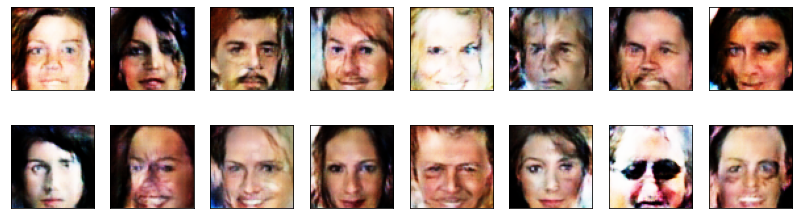

2025-01-02 13:09:05 | Epoch [12/20] | Batch 0/509 | d_loss: 0.9155 | g_loss: 2.2628
2025-01-02 13:09:10 | Epoch [12/20] | Batch 50/509 | d_loss: 0.8416 | g_loss: 1.8999
2025-01-02 13:09:15 | Epoch [12/20] | Batch 100/509 | d_loss: 0.8991 | g_loss: 2.3334
2025-01-02 13:09:20 | Epoch [12/20] | Batch 150/509 | d_loss: 0.8617 | g_loss: 2.3224
2025-01-02 13:09:25 | Epoch [12/20] | Batch 200/509 | d_loss: 0.8168 | g_loss: 2.7266
2025-01-02 13:09:30 | Epoch [12/20] | Batch 250/509 | d_loss: 0.8940 | g_loss: 1.9732
2025-01-02 13:09:35 | Epoch [12/20] | Batch 300/509 | d_loss: 0.8925 | g_loss: 1.7679
2025-01-02 13:09:40 | Epoch [12/20] | Batch 350/509 | d_loss: 0.7819 | g_loss: 2.3081
2025-01-02 13:09:45 | Epoch [12/20] | Batch 400/509 | d_loss: 1.0169 | g_loss: 1.3261
2025-01-02 13:09:50 | Epoch [12/20] | Batch 450/509 | d_loss: 0.8220 | g_loss: 2.0487
2025-01-02 13:09:55 | Epoch [12/20] | Batch 500/509 | d_loss: 0.8661 | g_loss: 1.6180


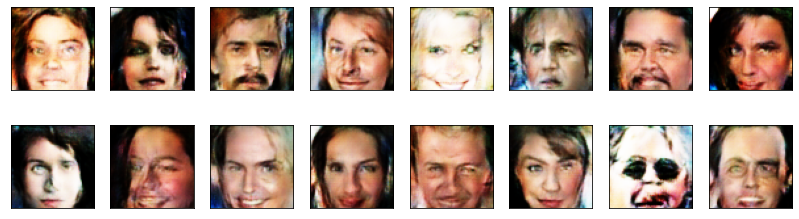

2025-01-02 13:10:00 | Epoch [13/20] | Batch 0/509 | d_loss: 0.7955 | g_loss: 1.8373
2025-01-02 13:10:05 | Epoch [13/20] | Batch 50/509 | d_loss: 0.8697 | g_loss: 1.9642
2025-01-02 13:10:10 | Epoch [13/20] | Batch 100/509 | d_loss: 0.7603 | g_loss: 2.4403
2025-01-02 13:10:15 | Epoch [13/20] | Batch 150/509 | d_loss: 0.8645 | g_loss: 1.7731
2025-01-02 13:10:20 | Epoch [13/20] | Batch 200/509 | d_loss: 0.8265 | g_loss: 1.8840
2025-01-02 13:10:25 | Epoch [13/20] | Batch 250/509 | d_loss: 0.9914 | g_loss: 1.5136
2025-01-02 13:10:30 | Epoch [13/20] | Batch 300/509 | d_loss: 0.8301 | g_loss: 2.3645
2025-01-02 13:10:35 | Epoch [13/20] | Batch 350/509 | d_loss: 0.9712 | g_loss: 2.3357
2025-01-02 13:10:40 | Epoch [13/20] | Batch 400/509 | d_loss: 1.0290 | g_loss: 1.6334
2025-01-02 13:10:45 | Epoch [13/20] | Batch 450/509 | d_loss: 0.9263 | g_loss: 2.2816
2025-01-02 13:10:50 | Epoch [13/20] | Batch 500/509 | d_loss: 0.9464 | g_loss: 1.7184


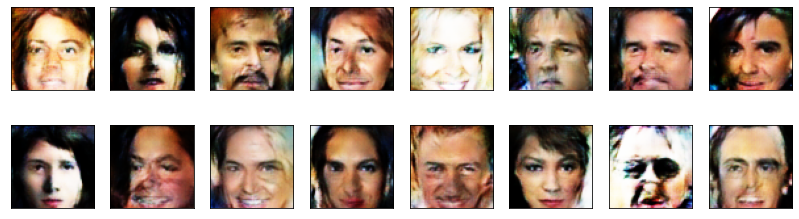

2025-01-02 13:10:55 | Epoch [14/20] | Batch 0/509 | d_loss: 1.1043 | g_loss: 1.6282
2025-01-02 13:11:01 | Epoch [14/20] | Batch 50/509 | d_loss: 0.8178 | g_loss: 2.5430
2025-01-02 13:11:06 | Epoch [14/20] | Batch 100/509 | d_loss: 0.8828 | g_loss: 1.9202
2025-01-02 13:11:11 | Epoch [14/20] | Batch 150/509 | d_loss: 0.9256 | g_loss: 1.4774
2025-01-02 13:11:16 | Epoch [14/20] | Batch 200/509 | d_loss: 0.7883 | g_loss: 2.6009
2025-01-02 13:11:21 | Epoch [14/20] | Batch 250/509 | d_loss: 1.0464 | g_loss: 1.4544
2025-01-02 13:11:26 | Epoch [14/20] | Batch 300/509 | d_loss: 0.9096 | g_loss: 2.4145
2025-01-02 13:11:31 | Epoch [14/20] | Batch 350/509 | d_loss: 0.8502 | g_loss: 1.8384
2025-01-02 13:11:36 | Epoch [14/20] | Batch 400/509 | d_loss: 0.9857 | g_loss: 3.6766
2025-01-02 13:11:41 | Epoch [14/20] | Batch 450/509 | d_loss: 0.8215 | g_loss: 2.2100
2025-01-02 13:11:46 | Epoch [14/20] | Batch 500/509 | d_loss: 0.9326 | g_loss: 2.2909


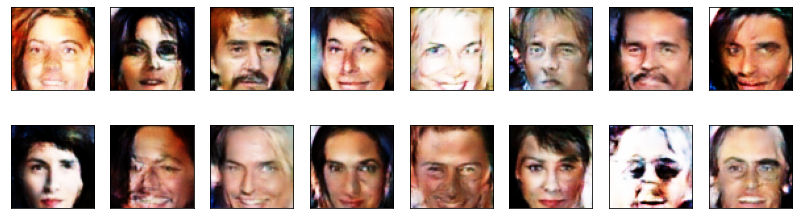

2025-01-02 13:11:51 | Epoch [15/20] | Batch 0/509 | d_loss: 0.9337 | g_loss: 1.7745
2025-01-02 13:11:56 | Epoch [15/20] | Batch 50/509 | d_loss: 0.8865 | g_loss: 2.3538
2025-01-02 13:12:01 | Epoch [15/20] | Batch 100/509 | d_loss: 0.9217 | g_loss: 2.0175
2025-01-02 13:12:06 | Epoch [15/20] | Batch 150/509 | d_loss: 0.9019 | g_loss: 2.2589
2025-01-02 13:12:11 | Epoch [15/20] | Batch 200/509 | d_loss: 0.8575 | g_loss: 2.4805
2025-01-02 13:12:16 | Epoch [15/20] | Batch 250/509 | d_loss: 0.8158 | g_loss: 1.9138
2025-01-02 13:12:21 | Epoch [15/20] | Batch 300/509 | d_loss: 0.8338 | g_loss: 2.4071
2025-01-02 13:12:26 | Epoch [15/20] | Batch 350/509 | d_loss: 0.8324 | g_loss: 2.4042
2025-01-02 13:12:31 | Epoch [15/20] | Batch 400/509 | d_loss: 0.8583 | g_loss: 2.8053
2025-01-02 13:12:36 | Epoch [15/20] | Batch 450/509 | d_loss: 0.7757 | g_loss: 2.2953
2025-01-02 13:12:41 | Epoch [15/20] | Batch 500/509 | d_loss: 0.8884 | g_loss: 2.5169


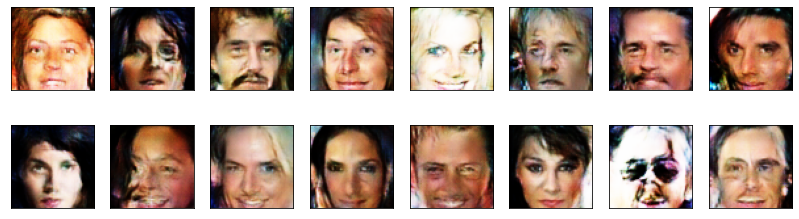

2025-01-02 13:12:46 | Epoch [16/20] | Batch 0/509 | d_loss: 0.8904 | g_loss: 2.7103
2025-01-02 13:12:51 | Epoch [16/20] | Batch 50/509 | d_loss: 0.8905 | g_loss: 1.9654
2025-01-02 13:12:57 | Epoch [16/20] | Batch 100/509 | d_loss: 0.9983 | g_loss: 1.6283
2025-01-02 13:13:02 | Epoch [16/20] | Batch 150/509 | d_loss: 0.8448 | g_loss: 1.9571
2025-01-02 13:13:07 | Epoch [16/20] | Batch 200/509 | d_loss: 0.8640 | g_loss: 1.6089
2025-01-02 13:13:12 | Epoch [16/20] | Batch 250/509 | d_loss: 0.8250 | g_loss: 1.2616
2025-01-02 13:13:17 | Epoch [16/20] | Batch 300/509 | d_loss: 0.9581 | g_loss: 2.6081
2025-01-02 13:13:22 | Epoch [16/20] | Batch 350/509 | d_loss: 0.8245 | g_loss: 1.8007
2025-01-02 13:13:27 | Epoch [16/20] | Batch 400/509 | d_loss: 0.8566 | g_loss: 1.8124
2025-01-02 13:13:32 | Epoch [16/20] | Batch 450/509 | d_loss: 0.9138 | g_loss: 1.6602
2025-01-02 13:13:37 | Epoch [16/20] | Batch 500/509 | d_loss: 0.9505 | g_loss: 2.3424


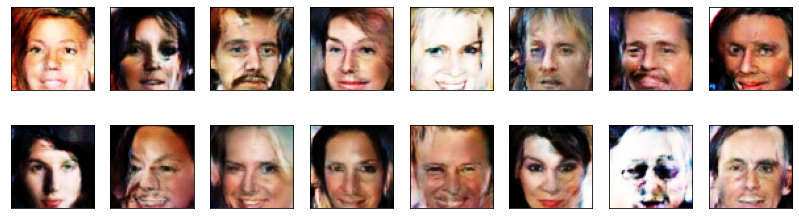

2025-01-02 13:13:42 | Epoch [17/20] | Batch 0/509 | d_loss: 0.7774 | g_loss: 2.2971
2025-01-02 13:13:47 | Epoch [17/20] | Batch 50/509 | d_loss: 0.7593 | g_loss: 1.8481
2025-01-02 13:13:52 | Epoch [17/20] | Batch 100/509 | d_loss: 0.8985 | g_loss: 2.8503
2025-01-02 13:13:57 | Epoch [17/20] | Batch 150/509 | d_loss: 0.9629 | g_loss: 1.6806
2025-01-02 13:14:02 | Epoch [17/20] | Batch 200/509 | d_loss: 0.7491 | g_loss: 2.3511
2025-01-02 13:14:07 | Epoch [17/20] | Batch 250/509 | d_loss: 0.8719 | g_loss: 1.9132
2025-01-02 13:14:12 | Epoch [17/20] | Batch 300/509 | d_loss: 1.0197 | g_loss: 3.2926
2025-01-02 13:14:17 | Epoch [17/20] | Batch 350/509 | d_loss: 0.9872 | g_loss: 1.7206
2025-01-02 13:14:23 | Epoch [17/20] | Batch 400/509 | d_loss: 0.9016 | g_loss: 2.4624
2025-01-02 13:14:28 | Epoch [17/20] | Batch 450/509 | d_loss: 0.8364 | g_loss: 2.1883
2025-01-02 13:14:33 | Epoch [17/20] | Batch 500/509 | d_loss: 0.9326 | g_loss: 3.6468


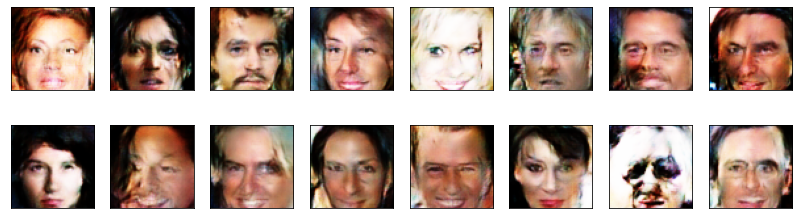

2025-01-02 13:14:37 | Epoch [18/20] | Batch 0/509 | d_loss: 0.7877 | g_loss: 2.1452
2025-01-02 13:14:42 | Epoch [18/20] | Batch 50/509 | d_loss: 0.8755 | g_loss: 1.7083
2025-01-02 13:14:47 | Epoch [18/20] | Batch 100/509 | d_loss: 0.7799 | g_loss: 1.6947
2025-01-02 13:14:53 | Epoch [18/20] | Batch 150/509 | d_loss: 0.8319 | g_loss: 1.9369
2025-01-02 13:14:58 | Epoch [18/20] | Batch 200/509 | d_loss: 0.9065 | g_loss: 2.0790
2025-01-02 13:15:03 | Epoch [18/20] | Batch 250/509 | d_loss: 0.8585 | g_loss: 2.2277
2025-01-02 13:15:08 | Epoch [18/20] | Batch 300/509 | d_loss: 0.7769 | g_loss: 2.1005
2025-01-02 13:15:13 | Epoch [18/20] | Batch 350/509 | d_loss: 0.8115 | g_loss: 2.3566
2025-01-02 13:15:18 | Epoch [18/20] | Batch 400/509 | d_loss: 0.7676 | g_loss: 2.1898
2025-01-02 13:15:23 | Epoch [18/20] | Batch 450/509 | d_loss: 0.8759 | g_loss: 3.0732
2025-01-02 13:15:28 | Epoch [18/20] | Batch 500/509 | d_loss: 0.9011 | g_loss: 2.4136


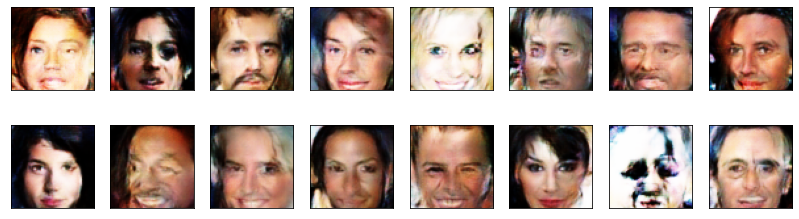

2025-01-02 13:15:33 | Epoch [19/20] | Batch 0/509 | d_loss: 0.7203 | g_loss: 2.6165
2025-01-02 13:15:38 | Epoch [19/20] | Batch 50/509 | d_loss: 0.8904 | g_loss: 3.0410
2025-01-02 13:15:43 | Epoch [19/20] | Batch 100/509 | d_loss: 0.8641 | g_loss: 2.0007
2025-01-02 13:15:48 | Epoch [19/20] | Batch 150/509 | d_loss: 0.8830 | g_loss: 1.6872
2025-01-02 13:15:53 | Epoch [19/20] | Batch 200/509 | d_loss: 0.7881 | g_loss: 2.1811
2025-01-02 13:15:58 | Epoch [19/20] | Batch 250/509 | d_loss: 0.9217 | g_loss: 2.7893
2025-01-02 13:16:03 | Epoch [19/20] | Batch 300/509 | d_loss: 0.8324 | g_loss: 2.2116
2025-01-02 13:16:08 | Epoch [19/20] | Batch 350/509 | d_loss: 0.9240 | g_loss: 1.6333
2025-01-02 13:16:13 | Epoch [19/20] | Batch 400/509 | d_loss: 0.7996 | g_loss: 2.6653
2025-01-02 13:16:18 | Epoch [19/20] | Batch 450/509 | d_loss: 1.1202 | g_loss: 1.2119
2025-01-02 13:16:23 | Epoch [19/20] | Batch 500/509 | d_loss: 0.7646 | g_loss: 2.1191


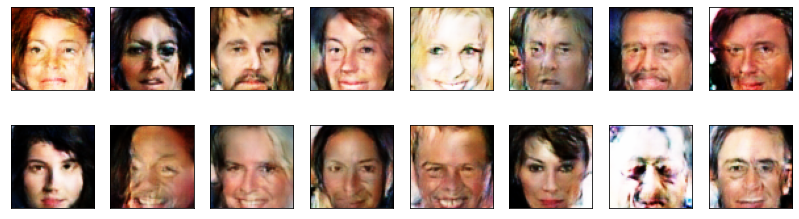

2025-01-02 13:16:27 | Epoch [20/20] | Batch 0/509 | d_loss: 0.8387 | g_loss: 2.1466
2025-01-02 13:16:32 | Epoch [20/20] | Batch 50/509 | d_loss: 0.7984 | g_loss: 2.2016
2025-01-02 13:16:37 | Epoch [20/20] | Batch 100/509 | d_loss: 1.0813 | g_loss: 1.1838
2025-01-02 13:16:42 | Epoch [20/20] | Batch 150/509 | d_loss: 0.7660 | g_loss: 2.1463
2025-01-02 13:16:47 | Epoch [20/20] | Batch 200/509 | d_loss: 1.1790 | g_loss: 3.5978
2025-01-02 13:16:52 | Epoch [20/20] | Batch 250/509 | d_loss: 0.7351 | g_loss: 2.3998
2025-01-02 13:16:58 | Epoch [20/20] | Batch 300/509 | d_loss: 0.7499 | g_loss: 2.6694
2025-01-02 13:17:03 | Epoch [20/20] | Batch 350/509 | d_loss: 0.8794 | g_loss: 1.6105
2025-01-02 13:17:08 | Epoch [20/20] | Batch 400/509 | d_loss: 0.7849 | g_loss: 2.5402
2025-01-02 13:17:13 | Epoch [20/20] | Batch 450/509 | d_loss: 0.9195 | g_loss: 1.7298
2025-01-02 13:17:18 | Epoch [20/20] | Batch 500/509 | d_loss: 0.8416 | g_loss: 2.6674


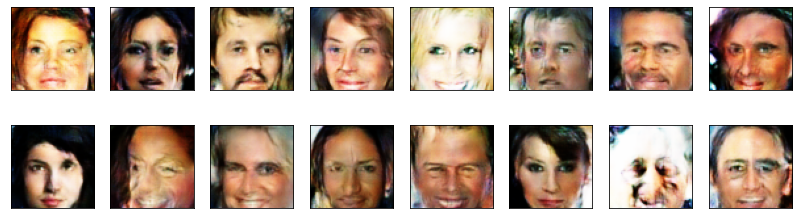

In [ ]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        d_loss = discriminator_step(batch_size, latent_dim, real_images)
        g_loss = generator_step(batch_size, latent_dim)
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

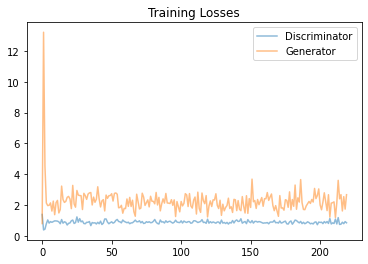

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** (Write your answer in this cell)
For diversity, adding various face images to dataset will improve this model. And adding more random noise will improve this model too.

More large and complex models like StyleGAN will get better result.

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.